# US Chronic Respiratory Disease Mortality EDA

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import plotly as py
import plotly.figure_factory as ff
import pandas as pd
from tqdm import tqdm
import os
from os.path import join as oj
import numpy as np
from bokeh.plotting import figure, show, output_notebook, output_file, save
import sys

## Load in raw data

In [2]:
data_dir_raw = "../../data/county_level/raw/ihme_respiratory"
sys.path.append(data_dir_raw)
import load

In [3]:
df_raw = load.load_ihme_respiratory(data_dir_raw)

In [4]:
df_raw.shape

(3193, 11)

In [5]:
df_raw.head()

,Location,FIPS,"Mortality Rate, 1980*","Mortality Rate, 1985*","Mortality Rate, 1990*","Mortality Rate, 1995*","Mortality Rate, 2000*","Mortality Rate, 2005*","Mortality Rate, 2010*","Mortality Rate, 2014*","% Change in Mortality Rate, 1980-2014"
1,Alabama,1.0,"42.43 (41.22, 43.60)","46.29 (45.24, 47.34)","49.95 (48.86, 51.12)","57.00 (55.78, 58.36)","65.65 (64.23, 67.09)","69.21 (67.66, 70.75)","70.86 (69.27, 72.46)","73.44 (71.54, 75.49)","73.08 (67.09, 79.45)"
2,"Autauga County, Alabama",1001.0,"46.56 (42.86, 50.68)","50.68 (47.16, 54.42)","55.55 (52.19, 59.07)","63.21 (59.85, 66.62)","71.77 (68.27, 75.56)","77.13 (73.44, 81.17)","77.75 (73.63, 81.85)","81.79 (77.37, 86.77)","75.67 (58.34, 95.40)"
3,"Baldwin County, Alabama",1003.0,"37.15 (34.89, 39.40)","39.46 (37.38, 41.68)","42.97 (40.88, 45.19)","48.15 (46.05, 50.62)","52.07 (49.85, 54.48)","52.56 (50.47, 54.77)","55.12 (52.87, 57.56)","54.28 (51.92, 56.65)","46.10 (35.48, 59.57)"
4,"Barbour County, Alabama",1005.0,"42.84 (39.76, 46.26)","46.78 (43.78, 50.05)","50.05 (47.18, 53.20)","57.07 (54.07, 60.08)","65.19 (61.87, 68.69)","66.93 (63.11, 70.52)","67.52 (63.26, 71.55)","69.82 (65.35, 74.56)","62.98 (47.20, 80.68)"
5,"Bibb County, Alabama",1007.0,"46.14 (42.19, 50.25)","51.21 (47.49, 55.26)","56.24 (52.68, 59.96)","65.08 (61.25, 69.46)","74.13 (69.86, 78.72)","76.93 (72.79, 81.34)","80.51 (75.82, 85.85)","84.49 (78.58, 90.47)","83.11 (62.21, 105.79)"


In [6]:
list(df_raw.keys())

['Location',
 'FIPS',
 'Mortality Rate, 1980*',
 'Mortality Rate, 1985*',
 'Mortality Rate, 1990*',
 'Mortality Rate, 1995*',
 'Mortality Rate, 2000*',
 'Mortality Rate, 2005*',
 'Mortality Rate, 2010*',
 'Mortality Rate, 2014*',
 '% Change in Mortality Rate, 1980-2014']

In [7]:
df_raw.FIPS.describe()

count     3193.000000
mean     29898.810836
std      15514.993121
min          1.000000
25%      18101.000000
50%      29125.000000
75%      45055.000000
max      56045.000000
Name: FIPS, dtype: float64

In [8]:
df_raw.dtypes

Location                                  object
FIPS                                     float64
Mortality Rate, 1980*                     object
Mortality Rate, 1985*                     object
Mortality Rate, 1990*                     object
Mortality Rate, 1995*                     object
Mortality Rate, 2000*                     object
Mortality Rate, 2005*                     object
Mortality Rate, 2010*                     object
Mortality Rate, 2014*                     object
% Change in Mortality Rate, 1980-2014     object
dtype: object

In [9]:
df_raw.isna().sum()

Location                                 0
FIPS                                     0
Mortality Rate, 1980*                    0
Mortality Rate, 1985*                    0
Mortality Rate, 1990*                    0
Mortality Rate, 1995*                    0
Mortality Rate, 2000*                    0
Mortality Rate, 2005*                    0
Mortality Rate, 2010*                    0
Mortality Rate, 2014*                    0
% Change in Mortality Rate, 1980-2014    0
dtype: int64

## Clean data

In [10]:
os.chdir("../../data/")
from county_level.processed.ihme_respiratory import clean
data_dir_raw = './county_level/raw/ihme_respiratory'
data_dir_clean = './county_level/processed/ihme_respiratory'

In [11]:
df = clean.clean_ihme_respiratory(data_dir_raw, data_dir_clean)

In [12]:
df.shape

(3193, 29)

In [13]:
list(df.keys())

['Location',
 'countyFIPS',
 'RespMortalityRate1980',
 'RespMortalityRate1985',
 'RespMortalityRate1990',
 'RespMortalityRate1995',
 'RespMortalityRate2000',
 'RespMortalityRate2005',
 'RespMortalityRate2010',
 'RespMortalityRate2014',
 'ChangeInRespMortality1980-2014',
 'RespMortalityRate1980LowCI95',
 'RespMortalityRate1980HighCI95',
 'RespMortalityRate1985LowCI95',
 'RespMortalityRate1985HighCI95',
 'RespMortalityRate1990LowCI95',
 'RespMortalityRate1990HighCI95',
 'RespMortalityRate1995LowCI95',
 'RespMortalityRate1995HighCI95',
 'RespMortalityRate2000LowCI95',
 'RespMortalityRate2000HighCI95',
 'RespMortalityRate2005LowCI95',
 'RespMortalityRate2005HighCI95',
 'RespMortalityRate2010LowCI95',
 'RespMortalityRate2010HighCI95',
 'RespMortalityRate2014LowCI95',
 'RespMortalityRate2014HighCI95',
 'ChangeInRespMortality1980-2014LowCI95',
 'ChangeInRespMortality1980-2014HighCI95']

In [14]:
df.dtypes

Location                                   object
countyFIPS                                 object
RespMortalityRate1980                     float64
RespMortalityRate1985                     float64
RespMortalityRate1990                     float64
RespMortalityRate1995                     float64
RespMortalityRate2000                     float64
RespMortalityRate2005                     float64
RespMortalityRate2010                     float64
RespMortalityRate2014                     float64
ChangeInRespMortality1980-2014            float64
RespMortalityRate1980LowCI95              float64
RespMortalityRate1980HighCI95             float64
RespMortalityRate1985LowCI95              float64
RespMortalityRate1985HighCI95             float64
RespMortalityRate1990LowCI95              float64
RespMortalityRate1990HighCI95             float64
RespMortalityRate1995LowCI95              float64
RespMortalityRate1995HighCI95             float64
RespMortalityRate2000LowCI95              float64


In [15]:
df.head()

,Location,countyFIPS,RespMortalityRate1980,RespMortalityRate1985,RespMortalityRate1990,RespMortalityRate1995,RespMortalityRate2000,RespMortalityRate2005,RespMortalityRate2010,RespMortalityRate2014,...,RespMortalityRate2000LowCI95,RespMortalityRate2000HighCI95,RespMortalityRate2005LowCI95,RespMortalityRate2005HighCI95,RespMortalityRate2010LowCI95,RespMortalityRate2010HighCI95,RespMortalityRate2014LowCI95,RespMortalityRate2014HighCI95,ChangeInRespMortality1980-2014LowCI95,ChangeInRespMortality1980-2014HighCI95
1,Alabama,00001,42.43,46.29,49.95,57.00,65.65,69.21,70.86,73.44,...,64.23,67.09,67.66,70.75,69.27,72.46,71.54,75.49,67.09,79.45
2,"Autauga County, Alabama",01001,46.56,50.68,55.55,63.21,71.77,77.13,77.75,81.79,...,68.27,75.56,73.44,81.17,73.63,81.85,77.37,86.77,58.34,95.40
3,"Baldwin County, Alabama",01003,37.15,39.46,42.97,48.15,52.07,52.56,55.12,54.28,...,49.85,54.48,50.47,54.77,52.87,57.56,51.92,56.65,35.48,59.57
4,"Barbour County, Alabama",01005,42.84,46.78,50.05,57.07,65.19,66.93,67.52,69.82,...,61.87,68.69,63.11,70.52,63.26,71.55,65.35,74.56,47.20,80.68
5,"Bibb County, Alabama",01007,46.14,51.21,56.24,65.08,74.13,76.93,80.51,84.49,...,69.86,78.72,72.79,81.34,75.82,85.85,78.58,90.47,62.21,105.79


In [16]:
df.isna().sum()

Location                                  0
countyFIPS                                0
RespMortalityRate1980                     0
RespMortalityRate1985                     0
RespMortalityRate1990                     0
RespMortalityRate1995                     0
RespMortalityRate2000                     0
RespMortalityRate2005                     0
RespMortalityRate2010                     0
RespMortalityRate2014                     0
ChangeInRespMortality1980-2014            0
RespMortalityRate1980LowCI95              0
RespMortalityRate1980HighCI95             0
RespMortalityRate1985LowCI95              0
RespMortalityRate1985HighCI95             0
RespMortalityRate1990LowCI95              0
RespMortalityRate1990HighCI95             0
RespMortalityRate1995LowCI95              0
RespMortalityRate1995HighCI95             0
RespMortalityRate2000LowCI95              0
RespMortalityRate2000HighCI95             0
RespMortalityRate2005LowCI95              0
RespMortalityRate2005HighCI95   

In [17]:
df.describe()

,RespMortalityRate1980,RespMortalityRate1985,RespMortalityRate1990,RespMortalityRate1995,RespMortalityRate2000,RespMortalityRate2005,RespMortalityRate2010,RespMortalityRate2014,ChangeInRespMortality1980-2014,RespMortalityRate1980LowCI95,...,RespMortalityRate2000LowCI95,RespMortalityRate2000HighCI95,RespMortalityRate2005LowCI95,RespMortalityRate2005HighCI95,RespMortalityRate2010LowCI95,RespMortalityRate2010HighCI95,RespMortalityRate2014LowCI95,RespMortalityRate2014HighCI95,ChangeInRespMortality1980-2014LowCI95,ChangeInRespMortality1980-2014HighCI95
count,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,...,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.000000,3193.00000,3193.000000
mean,42.206192,45.052343,47.800689,53.993539,60.442700,62.265587,62.024588,63.655662,53.816953,38.784635,...,56.932318,64.095828,58.583395,66.107037,58.116809,66.120977,59.266677,68.282722,37.82207,71.925863
std,9.673434,9.487175,9.634526,10.805490,12.611087,14.009525,15.256331,16.881974,37.562997,8.997259,...,12.078015,13.286137,13.406097,14.750536,14.537020,16.125594,15.983197,17.954175,33.67246,42.517414
min,16.660000,23.520000,24.190000,24.250000,23.680000,19.390000,15.630000,14.270000,-52.910000,12.810000,...,21.010000,26.740000,17.210000,21.930000,13.810000,17.770000,12.390000,16.260000,-63.47000,-48.880000
25%,35.990000,39.050000,41.780000,47.050000,52.160000,52.840000,51.730000,52.060000,26.900000,33.060000,...,48.920000,55.520000,49.600000,56.230000,48.280000,55.040000,48.260000,55.890000,13.94000,41.690000
50%,40.780000,43.870000,46.840000,53.240000,59.670000,61.620000,60.960000,62.290000,52.720000,37.470000,...,56.310000,63.190000,57.860000,65.300000,57.260000,65.100000,58.090000,66.970000,36.97000,71.160000
75%,46.300000,49.510000,52.540000,59.620000,67.370000,70.260000,70.610000,73.270000,78.680000,42.830000,...,63.680000,71.190000,66.500000,74.360000,66.510000,75.150000,68.440000,78.390000,59.66000,100.650000
max,126.700000,113.830000,119.750000,125.820000,138.860000,141.100000,148.110000,160.970000,223.990000,111.350000,...,132.540000,145.070000,133.840000,148.470000,139.550000,157.150000,150.870000,172.860000,187.94000,263.480000


## Visualizations

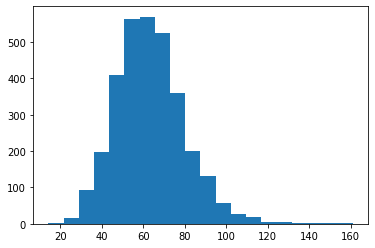

In [18]:
num_bins = 20
plt.hist(df['RespMortalityRate2014'].dropna(), num_bins)
plt.show()

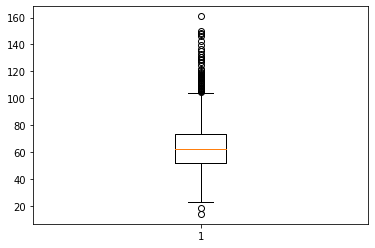

In [19]:
plt.boxplot(df['RespMortalityRate2014'].dropna())
plt.show()

In [20]:
#state_fips = df['countyFIPS'] % 1000 == 0
fig = ff.create_choropleth(fips = df['countyFIPS'].tolist(), 
                           values = df['RespMortalityRate2014'].tolist())
fig.show()

/Users/Tiffany/Applications/anaconda3/lib/python3.7/site-packages/plotly/figure_factory/_county_choropleth.py:845: UserWarning:

Unrecognized FIPS Values

Whoops! It looks like you are trying to pass at least one FIPS value that is not in our shapefile of FIPS and data for the counties. Your choropleth will still show up but these counties cannot be shown.
Unrecognized FIPS are: [1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56]

